In [43]:
import numpy as np
import pandas as pd
import anndata as ad
from anndata import AnnData
import scanpy as sc

import matplotlib.pyplot as plt

import gc
import glob
import sys

from tqdm import tqdm

import torch 
torch.set_float32_matmul_precision("high")
torch.backends.cuda.matmul.allow_tf32 = True
torch.backends.cudnn.allow_tf32 = True

torch.cuda.is_available()
torch.cuda.device_count()

1

In [44]:
def cleanup():
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    gc.collect()

def flatten_list(xss):
    return [x for xs in xss for x in xs]

In [45]:
adata = sc.read_h5ad("data/ns-atlas.merfish_baysor.scanvi_integrated.cellcharter.anndata.annotated.h5ad")
filt = (adata.obs['tissue_compartment'] != 'outside tissue') & (~adata.obs['cell_type.detailed'].isin(['Unknown', 'Doublet']))
adata = adata[filt].copy()
gc.collect()

6165

In [46]:
lrdb = pd.read_csv("/sc/arion/projects/ji_lab/USER/restrp01/ns-atlas/data/cellchat/CellChatDB_interaction_table.csv", index_col=0)
lrdb['ligand'] = lrdb['ligand.symbol'].apply(lambda x: x.replace(", ", "+"))
lrdb['receptor'] = lrdb['receptor.symbol'].apply(lambda x: x.replace(", ", "+"))
lrdb['interaction_name'] = lrdb['ligand'] + "_" + lrdb['receptor']
lrdb = lrdb[['interaction_name', 'ligand', 'receptor','pathway_name', 'annotation']].drop_duplicates()
lrdb.index = lrdb['interaction_name'].values.copy()

# filter the LRs for those where all constituent genes in the interaction are present in the adata object.
lr_list = lrdb['interaction_name'].apply(lambda x: x.replace("+", "_").split("_"))
lr_filt = lr_list.apply(lambda x: sum([i in adata.var_names for i in x])/len(x) == 1)
lrdb = lrdb[lr_filt]

# prepare variables for the ligands, receptors, their genes, and tuples to have on-hand.
ligand_ids =  lrdb['ligand'].tolist()
receptor_ids = lrdb['receptor'].tolist()

ligands = lrdb["ligand"].apply(lambda x: x.split("+")).tolist()
receptors = lrdb["receptor"].apply(lambda x: x.split("+")).tolist()
lr_pairs = [(ligands[i], receptors[i]) for i in range(0, len(ligands))]

receptor_genes = np.unique(flatten_list(receptors))
ligand_genes = np.unique(flatten_list(ligands))
lr_genes = np.unique(np.concatenate([ligand_genes, receptor_genes]))
cleanup()

In [47]:
lrdb.head()

,interaction_name,ligand,receptor,pathway_name,annotation
TGFB1_TGFBR2+TGFBR1,TGFB1_TGFBR2+TGFBR1,TGFB1,TGFBR2+TGFBR1,TGFb,Secreted Signaling
TGFB2_TGFBR2+TGFBR1,TGFB2_TGFBR2+TGFBR1,TGFB2,TGFBR2+TGFBR1,TGFb,Secreted Signaling
TGFB3_TGFBR2+TGFBR1,TGFB3_TGFBR2+TGFBR1,TGFB3,TGFBR2+TGFBR1,TGFb,Secreted Signaling
TGFB1_TGFBR2+ACVR1+TGFBR1,TGFB1_TGFBR2+ACVR1+TGFBR1,TGFB1,TGFBR2+ACVR1+TGFBR1,TGFb,Secreted Signaling
TGFB2_TGFBR2+ACVR1+TGFBR1,TGFB2_TGFBR2+ACVR1+TGFBR1,TGFB2,TGFBR2+ACVR1+TGFBR1,TGFb,Secreted Signaling


In [31]:
torch.cuda.empty_cache()
gc.collect()

0

In [32]:
neighbordf = pd.read_csv("data/metadata/ns-atlas.merfish.k10.knn_neighbor_df.csv.gz", index_col=0, dtype={'centroid_cell': object, 'neighbor_cell': object})
# filter the neighbordf for those within the 200 um
filt = (neighbordf['distance'] <= 200) & (neighbordf['rank'] <= 5)
neighbordf = neighbordf[filt].sort_values(["centroid_cell", "rank"]) # Ensure correct order by rank

In [33]:
grouped = (
    neighbordf
    .sort_values(["centroid_cell", "rank"])  # Ensure correct order by rank
    .groupby("centroid_cell")["neighbor_cell"]
    .apply(list)
)
centroid_cells = np.unique(np.intersect1d(adata.obs_names.values, grouped.index.values))
neighbor_list = [grouped[centroid] for centroid in centroid_cells]

In [34]:
centroid_to_neighbors = (
    neighbordf
    .groupby("centroid_cell")["neighbor_cell"]
    .apply(list)
    .to_dict()
)

neighbor_list = []
for centroid in centroid_cells:
    neighbors = centroid_to_neighbors.get(centroid, [])
    neighbor_indices = np.array([adata.obs_names.get_loc(nbr) for nbr in neighbors], dtype=int)
    neighbor_list.append(neighbor_indices)

In [48]:
def aggregate_subunits(adata, layer, subunit_list, subunit_sep='+', device='cuda'):
    from collections import defaultdict
    import pandas as pd
    obs_names = adata.obs_names.copy()
    var_names = adata.var_names.copy()
    gene_index = {gene: i for i, gene in enumerate(var_names)}
    
    X = adata.layers[layer]
    if not isinstance(X, np.ndarray):
        X = X.toarray()
    
    subunit_dict = dict(zip(subunit_list, [x.split(subunit_sep) for x in subunit_list]))

    expr_dict = {}
    
    for key, value in subunit_dict.items():
        idx = [gene_index[g] for g in value]
        expr = torch.tensor(X[:, idx], device=device, dtype=torch.float32).min(dim=1).values
        expr_dict[key] = expr.cpu().numpy()
    
    cleanup()

    return expr_dict

In [49]:
expr_dict = aggregate_subunits(adata, layer='log1p', subunit_list=np.unique(np.concatenate([ligand_ids, receptor_ids])))
expr_mat = pd.DataFrame(expr_dict, index=adata.obs_names)
cleanup()

In [12]:
expr_mat.to_csv("data/merfish_lr_subunit_expression_matrix.csv")

In [37]:
import torch
from scipy.stats import rankdata

def score_additive(lig_neigh, rec_neigh, **kwargs):
    """Returns the average of ligand and receptor expression."""
    return 0.5 * (lig_neigh + rec_neigh)

def score_geometric(lig_neigh, rec_neigh, **kwargs):
    """Returns the geometric mean of ligand and receptor expression with a pseudocount."""
    lig_c = torch.clamp(lig_neigh, min=0)
    rec_c = torch.clamp(rec_neigh, min=0)
    return torch.sqrt(lig_c * rec_c)

SCORING_FUNCTIONS = {
    "additive": score_additive,
    "geometric": score_geometric
}


In [14]:
def score_knn_lrs(
    expr,
    lrdb,
    obs_names,
    neighbor_list,
    ligand_key: str = 'ligand',
    receptor_key: str = 'receptor',
    interaction_key: str = 'interaction_name',
    mode: str = 'additive',
    device: str = 'cuda'
):

    expr = {key: torch.tensor(value, device=device) for key, value in expr.items()}

    
    # Pad neighbor list
    max_k = max(len(nbrs) for nbrs in neighbor_list)
    padded_neighbors = torch.full((len(neighbor_list), max_k), fill_value=-1, dtype=torch.long, device=device)
    for i, nbrs in enumerate(neighbor_list):
        padded_neighbors[i, :len(nbrs)] = torch.tensor(nbrs, device=device)

    # Create mask (True = valid index)
    neighbor_mask = padded_neighbors != -1

    lr_scores = {}
    with tqdm(total=len(lrdb), desc="Scoring LR pairs", unit="LR", ncols=100, leave=True) as pbar:
        for index, row in lrdb.iterrows():
            interaction_name = row[interaction_key]
            ligand = row[ligand_key]
            receptor = row[receptor_key]

            lig_expr = expr[ligand]  # shape: [C]
            rec_expr = expr[receptor]  # shape: [C]
            
            # Assume expr is a torch.Tensor with shape [G, C]
            # Lookup expressions using padded neighbors
            lig_expr = lig_expr[padded_neighbors]  # shape: [n_cells, max_k]
            rec_expr = rec_expr[padded_neighbors]

            # Mask invalid entries
            lig_expr[~neighbor_mask] = float('nan')
            rec_expr[~neighbor_mask] = float('nan')

            lig_neigh = lig_expr.nanmean(dim=1)
            rec_neigh = rec_expr.nanmean(dim=1)
            
            score_fn = SCORING_FUNCTIONS[mode]
            scores = score_fn(lig_neigh, rec_neigh)
            if not isinstance(scores, torch.Tensor):
                scores = torch.tensor(scores, device=expr.device)

            lr_scores[interaction_name] = scores.cpu().numpy()

            pbar.update(1)
    
    cleanup()
    
    score_mat = pd.DataFrame(lr_scores, index = obs_names)
    return(score_mat)

In [15]:
gmean_scores = score_knn_lrs(
    expr = expr_dict, lrdb = lrdb, obs_names = centroid_cells, neighbor_list=neighbor_list,
    ligand_key='ligand', receptor_key='receptor', interaction_key='interaction_name', mode='geometric'
)

Scoring LR pairs: 100%|██████████████████████████████████████████| 215/215 [00:00<00:00, 296.72LR/s]


In [16]:
additive_scores = score_knn_lrs(
    expr = expr_dict, lrdb = lrdb, obs_names = centroid_cells, neighbor_list=neighbor_list,
    ligand_key='ligand', receptor_key='receptor', interaction_key='interaction_name', mode='additive'
)

Scoring LR pairs: 100%|██████████████████████████████████████████| 215/215 [00:00<00:00, 428.21LR/s]


In [17]:
obs = adata.obs.loc[centroid_cells, :]

In [18]:
lr_adata = ad.AnnData(X=gmean_scores, obs=obs, var=lrdb)
lr_adata.layers['additive'] = additive_scores.copy()
lr_adata.layers['gmean'] = gmean_scores.copy()
lr_adata.obsm['spatial'] = adata[obs.index].obsm['spatial'].copy()

In [19]:
from scipy.stats import zscore
lr_adata.layers['additive_zscore'] = zscore(lr_adata.layers['additive'], axis=0, nan_policy="omit").copy()
lr_adata.layers['gmean_zscore'] = zscore(lr_adata.layers['gmean'], axis=0, nan_policy="omit").copy()

In [20]:
lr_adata.write_h5ad("data/cellchat/merfish.lr_scores.full.anndata_object.h5ad")

In [27]:
lrs = lrdb['interaction_name']

In [28]:
import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sns
from matplotlib.pyplot import rc_context
from matplotlib.patches import Rectangle
from matplotlib.lines import Line2D

def plot_lr_spatial_by_sample(
    adata,
    score_key,
    layer=None,
    sample_key="sample",
    point_size=3,
    cmap="magma",
    vmin=None,
    vmax=None,
    save=False,
    output_directory='.',
    file_prefix='LR',
    ncols = 1,
    figsize=(5, 5),
    dpi=300,
    show=False
):
    samples = adata.obs[sample_key].cat.categories.unique().sort_values()
    n_samples = len(samples)

    nrows = (n_samples + ncols - 1) // ncols

    fig, axes = plt.subplots(nrows, ncols, figsize=(figsize[0]*ncols, figsize[1]*nrows))
    axes = np.array(axes).reshape(-1)

    for i, sample in enumerate(samples):
        ax = axes[i]
        adata_sub = adata[adata.obs[sample_key] == sample]

        ax.set_aspect('equal', adjustable='datalim')
        ax.set_alpha(0.5)
        sc.pl.embedding(adata_sub,basis='spatial', layer=layer,
                        title=f"{sample}", color=score_key, 
                        cmap=cmap, s=point_size, ax=ax,  
                        legend_loc='on data', show=False)
        
        xlim = ax.get_xlim()
        ylim = ax.get_ylim()
        scale_bar_length = 1000  # microns
        padding = 0.05 * (xlim[1] - xlim[0])
        bar_x_start = xlim[1] - scale_bar_length - padding
        bar_y_start = ylim[0]
        
        ax.add_patch(Rectangle(
            (bar_x_start, bar_y_start), scale_bar_length, 0,
            linewidth=5, edgecolor='black', facecolor='black'
        ))
        ax.set_xticks([])
        ax.set_yticks([])

        ax.axis("off")

    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)

    # Add a global panel title
    fig.suptitle(f"{score_key}", fontsize=14, y=1)
    plt.tight_layout()
    if save:
        plt.savefig(f"{output_directory}/{file_prefix}.{score_key}.lr_score.spatial_plot.png", 
                    bbox_inches='tight', dpi=dpi)
    if show:
        plt.show()
    plt.close()

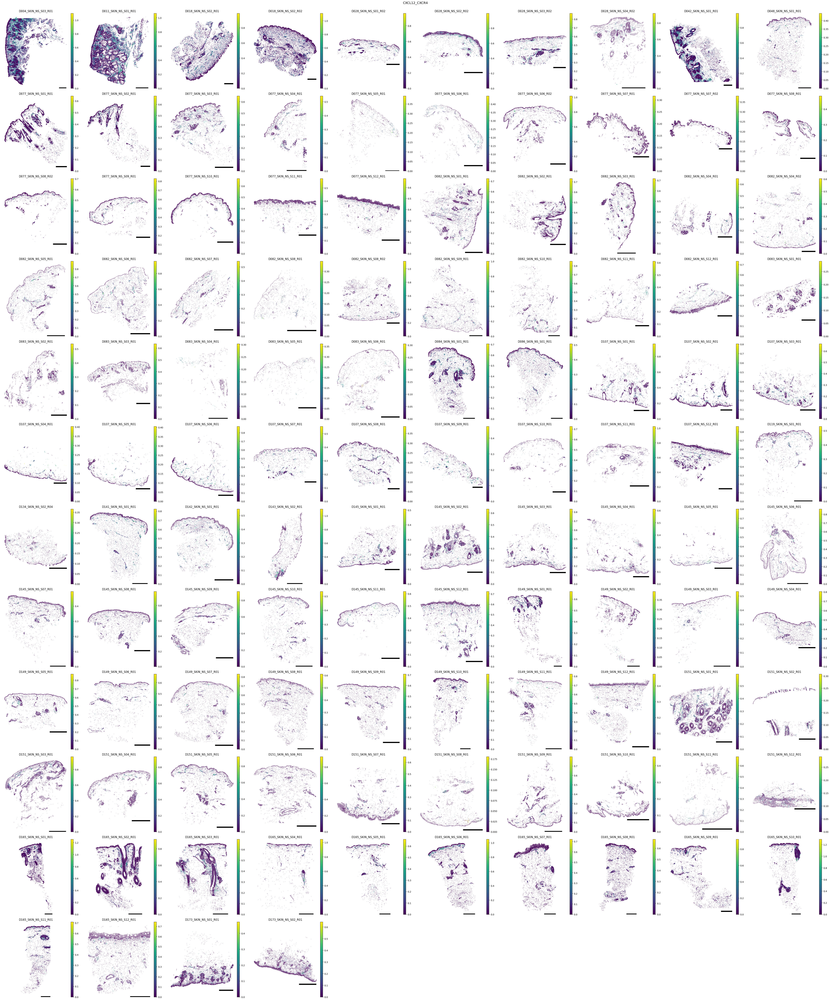

In [40]:
plot_lr_spatial_by_sample(
    lr_adata,
    ncols=10,
    layer='additive',
    score_key="CXCL12_CXCR4",
    sample_key="sample_barcode",
    cmap="viridis",
    show=True
)

In [41]:
lrs = lr_adata.var_names.sort_values().tolist()
lrs

['ANGPT2_ITGA5+ITGB1',
 'AREG_EGFR',
 'BMP4_ACVR2A+BMPR1A',
 'BMP4_BMPR2+BMPR1A',
 'BMP7_ACVR1+ACVR2A',
 'BMP7_ACVR2A+BMPR1A',
 'BMP7_BMPR2+ACVR1',
 'BMP7_BMPR2+BMPR1A',
 'C3_C3AR1',
 'CCL11_ACKR1',
 'CCL11_ACKR2',
 'CCL11_CCR3',
 'CCL17_ACKR1',
 'CCL17_ACKR2',
 'CCL17_CCR4',
 'CCL18_ACKR1',
 'CCL19_CCR7',
 'CCL20_CCR6',
 'CCL21_CCR7',
 'CCL22_ACKR2',
 'CCL22_CCR4',
 'CCL26_ACKR2',
 'CCL26_CCR3',
 'CCL2_ACKR1',
 'CCL2_ACKR2',
 'CCL2_CCR2',
 'CCL3_ACKR2',
 'CCL3_CCR5',
 'CCL4_ACKR2',
 'CCL4_CCR5',
 'CCL5_ACKR1',
 'CCL5_ACKR2',
 'CCL5_CCR3',
 'CCL5_CCR4',
 'CCL5_CCR5',
 'CD274_PDCD1',
 'CD40LG_CD40',
 'CD40LG_ITGA5+ITGB1',
 'CD55_ADGRE5',
 'CD69_KLRB1',
 'CD80_CD274',
 'CD80_CD28',
 'CD80_CTLA4',
 'CD86_CD28',
 'CD86_CTLA4',
 'CLDN3_CLDN3',
 'COL1A1_ITGA2+ITGB1',
 'COL1A1_ITGA3+ITGB1',
 'COL1A1_ITGB1+ITGA1',
 'COL4A1_ITGA2+ITGB1',
 'COL4A1_ITGA3+ITGB1',
 'COL4A1_ITGB1+ITGA1',
 'COL6A1_ITGA2+ITGB1',
 'COL6A1_ITGA3+ITGB1',
 'COL6A1_ITGB1+ITGA1',
 'COL6A5_ITGA2+ITGB1',
 'COL6A5_ITGA3+ITGB1'

In [42]:
len(lr_adata.var_names)

215

In [ ]:
for lr in lrs:
    print(lr)
    plot_lr_spatial_by_sample(
        lr_adata,
        ncols=10,
        layer='additive',
        score_key=lr,
        sample_key="sample_barcode",
        cmap="viridis",
        save=True,
        output_directory="figures/lr_scores/additive",
        file_prefix='D165'
        )
    

ANGPT2_ITGA5+ITGB1
AREG_EGFR
BMP4_ACVR2A+BMPR1A
BMP4_BMPR2+BMPR1A
BMP7_ACVR1+ACVR2A
BMP7_ACVR2A+BMPR1A
BMP7_BMPR2+ACVR1
BMP7_BMPR2+BMPR1A
C3_C3AR1
CCL11_ACKR1
CCL11_ACKR2
CCL11_CCR3
CCL17_ACKR1
CCL17_ACKR2
CCL17_CCR4
CCL18_ACKR1
CCL19_CCR7
CCL20_CCR6
CCL21_CCR7
CCL22_ACKR2
CCL22_CCR4
CCL26_ACKR2
CCL26_CCR3
CCL2_ACKR1
CCL2_ACKR2
CCL2_CCR2
CCL3_ACKR2
CCL3_CCR5
CCL4_ACKR2
CCL4_CCR5
CCL5_ACKR1
CCL5_ACKR2
CCL5_CCR3
CCL5_CCR4
CCL5_CCR5
CD274_PDCD1
CD40LG_CD40
CD40LG_ITGA5+ITGB1
CD55_ADGRE5
CD69_KLRB1
CD80_CD274
CD80_CD28
CD80_CTLA4
CD86_CD28
CD86_CTLA4
CLDN3_CLDN3
COL1A1_ITGA2+ITGB1
COL1A1_ITGA3+ITGB1
COL1A1_ITGB1+ITGA1
COL4A1_ITGA2+ITGB1
COL4A1_ITGA3+ITGB1
COL4A1_ITGB1+ITGA1
COL6A1_ITGA2+ITGB1
COL6A1_ITGA3+ITGB1
COL6A1_ITGB1+ITGA1
COL6A5_ITGA2+ITGB1
COL6A5_ITGA3+ITGB1
COL6A5_ITGB1+ITGA1
COMP_ITGA3+ITGB1
CSF1_CSF1R
CXCL10_ACKR1
CXCL10_CXCR3
CXCL11_ACKR1
CXCL11_CXCR3
CXCL12_CXCR4
CXCL13_ACKR1
CXCL13_CXCR3
CXCL16_CXCR6
CXCL1_ACKR1
CXCL1_CXCR1
CXCL1_CXCR2
CXCL5_ACKR1
CXCL5_CXCR1
CXCL5_CXCR2
CXC

In [18]:
def spatial_feature_plot(
    adata,
    gene,
    layer=None,
    sample_key="sample",
    point_size=5,
    cmap="magma",
    vmin=None,
    vmax=None,
    output_directory='.',
    file_prefix='',
    ncols = 1,
    figsize=(5, 5),
    dpi=300,
    show=False
):
    samples = adata.obs[sample_key].cat.categories.unique().sort_values()
    n_samples = len(samples)

    nrows = (n_samples + ncols - 1) // ncols

    fig, axes = plt.subplots(nrows, ncols, figsize=(figsize[0]*ncols, figsize[1]*nrows))
    axes = np.array(axes).reshape(-1)

    for i, sample in enumerate(samples):
        ax = axes[i]
        adata_sub = adata[adata.obs[sample_key] == sample]

        ax.set_aspect('equal', adjustable='datalim')
        ax.set_alpha(0.5)

        sc.pl.embedding(adata_sub, basis='spatial', layer=layer,
                        title=f"{sample}", color=gene, 
                        vmax=vmax, vmin=vmin,
                        cmap=cmap, s=point_size, ax=ax,  
                        legend_loc='on data', show=False
                       )
        
        xlim = ax.get_xlim()
        ylim = ax.get_ylim()
        scale_bar_length = 1000  # microns
        padding = 0.05 * (xlim[1] - xlim[0])
        bar_x_start = xlim[1] - scale_bar_length - padding
        bar_y_start = ylim[0]
        
        ax.add_patch(Rectangle(
            (bar_x_start, bar_y_start), scale_bar_length, 0,
            linewidth=5, edgecolor='black', facecolor='black'
        ))
        ax.set_xticks([])
        ax.set_yticks([])

        ax.axis("off")

    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)

    # Add a global panel title
    fig.suptitle(f"{gene}", fontsize=14, y=0.99)
    plt.tight_layout()
    
    plt.savefig(f"{output_directory}/{file_prefix}.{gene}.spatial_plot.png", 
                bbox_inches='tight', dpi=dpi)
    if show:
        plt.show()
    plt.close()

In [65]:
adata

AnnData object with n_obs × n_vars = 178691 × 562
    obs: 'EntityID', 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'sample_id', 'total_blank', 'percent_blank', 'blank_rate', 'transcript_density', 'gene_count', 'log1p_transcript_count', 'lib_size', 'cell_barcode', 'tx_count.total', 'tx_pct.within_cells', 'n_cells.total', 'median.genes_count', 'mean.genes_count', 'median.tx_count', 'mean.tx_count', 'median.volume', 'mean.volume', 'segmentation', 'total_area_mm2', 'run_region', 'batch', 'gene_panel', 'run_name', 'region_name', 'donor_id', 'donor_sex', 'anatomic_site', 'collection_source', 'n_counts', '_scvi_batch', '_scvi_labels', 'scvi.leiden_0.2', 'scvi.leiden_0.4', 'scvi.leiden_0.5', 'run_name.short', 'scvi.leiden_0.6', 'scvi.leiden_0.8', 'scvi.leiden_1', 'scvi.leiden_1.5', 'scvi.leiden_2', 'scvi.leiden_2.5', 'labels_scanvi', 'scrna_predicted_id', 'cell_type.broad', 'cell_category', '

In [15]:
import matplotlib.colors as clr
gray2blue = sns.blend_palette([sns.xkcd_rgb["light grey"], sns.xkcd_rgb["purplish blue"]], as_cmap=True)
gray2red = sns.blend_palette([sns.xkcd_rgb["light grey"], sns.xkcd_rgb["dark magenta"]], as_cmap=True)

In [27]:
spatial_feature_plot(adata, gene = "TNF", sample_key='sample_barcode', cmap=gray2blue, layer='scaled', vmax=3, vmin=0,
                     output_directory="figures/feature_spatial", file_prefix='D165')
spatial_feature_plot(adata, gene = "CXCL12", sample_key='sample_barcode', cmap=gray2blue, layer='scaled', vmax=3, vmin=0,
                     output_directory="figures/feature_spatial", file_prefix='D165')
spatial_feature_plot(adata, gene = "COMP", sample_key='sample_barcode', cmap=gray2blue, layer='scaled', vmax=3, vmin=0,
                     output_directory="figures/feature_spatial", file_prefix='D165')

In [28]:
spatial_feature_plot(adata, gene = "CXCR4", sample_key='sample_barcode', cmap=gray2red, layer='scaled', vmax=3, vmin=0,
                     output_directory="figures/feature_spatial", file_prefix='D165')
spatial_feature_plot(adata, gene = "ITGA3", sample_key='sample_barcode', cmap=gray2red, layer='scaled', vmax=3, vmin=0,
                     output_directory="figures/feature_spatial", file_prefix='D165')
spatial_feature_plot(adata, gene = "ITGB1", sample_key='sample_barcode', cmap=gray2red, layer='scaled', vmax=3, vmin=0,
                     output_directory="figures/feature_spatial", file_prefix='D165')

In [50]:
import torch
import pandas as pd
from tqdm import tqdm
from collections import defaultdict
import itertools
import decoupler as dc
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [51]:
neighborhoods = ['DEJ', 'PERIVASC-I', 'DIFF-IFE', 'PERIVASC-II', 'STROMA', 'UPPER-HF', 'ECCRINE', 'SEB-GLND', 'SUBCUTIS', 'LOWER-HF']

In [52]:
pb_adata = ad.AnnData(expr_mat, obs = adata.obs.loc[expr_mat.index.values].copy())
pb_adata.obs['neighborhood_celltype'] = pb_adata.obs['neighborhood'].astype(str) + ": " + pb_adata.obs['cell_type.detailed'].astype(str)

In [54]:
result_list = []
for nhood in neighborhoods:
    print(nhood)
    nhood_adata = pb_adata[pb_adata.obs['neighborhood'] == nhood].copy()
    nhood_adata = dc.pp.pseudobulk(nhood_adata, sample_col="sample_barcode", groups_col="cell_type.detailed", mode='sum', skip_checks = True)
    nhood_adata.write_h5ad(f"data/cellchat/{nhood}.tangram_lr_expr.neighborhood_celltype_sample.pseudobulk.sum.h5ad")

    detailed_celltypes = list(np.unique(nhood_adata.obs['cell_type.detailed'].astype('str').values))
    print(detailed_celltypes)

    cleanup()
    
    celltype_pairs = [pair for pair in itertools.product(detailed_celltypes, repeat=2)]
    
    # Assume nhood_adata.X is already pseudobulked: rows = sample-celltype, columns = genes
    # And nhood_adata.obs has 'sample_barcode' and 'cell_type.detailed'
    # Genes in nhood_adata.var_names
    
    # Precompute mapping from gene name to index
    gene_names = list(nhood_adata.var_names)
    gene_to_idx = {g: i for i, g in enumerate(gene_names)}
    
    # Convert entire expression matrix to torch tensor on GPU
    expr_matrix = torch.tensor(nhood_adata.X, dtype=torch.float32, device=device)
    obs_df = nhood_adata.obs
    
    # Extract unique samples for final output index
    sample_barcodes = obs_df['sample_barcode'].values
    nhood_result_list = []
    with tqdm(total=len(celltype_pairs), desc="Scoring LR pairs", unit="LR", ncols=100, leave=True) as pbar:
        for sender, receiver in celltype_pairs:
            pair = f"{sender} -> {receiver}"
        
            # Indices of rows corresponding to sender and receiver pseudobulked celltypes
            sender_mask = (obs_df['cell_type.detailed'].values == sender)
            receiver_mask = (obs_df['cell_type.detailed'].values == receiver)
        
            sender_expr = expr_matrix[sender_mask]  # shape [n_samples, n_genes]
            receiver_expr = expr_matrix[receiver_mask]  # shape [n_samples, n_genes]
        
            assert sender_expr.shape[0] == receiver_expr.shape[0], "Mismatch in sample count"
        
            # Output structure
            lr_scores = {
                'neighborhood': [nhood] * sender_expr.shape[0],
                'sample_barcode': sample_barcodes[sender_mask],
                'pair': [pair] * sender_expr.shape[0],
                'sender': [sender] * sender_expr.shape[0],
                'receiver': [receiver] * sender_expr.shape[0]
            }
        
            # Batch all interactions at once: build index vectors
            lig_idx = torch.tensor([gene_to_idx[lig] for lig in lrdb['ligand']], device=device)
            rec_idx = torch.tensor([gene_to_idx[rec] for rec in lrdb['receptor']], device=device)
        
            # Extract expression for all ligands and receptors
            lig_expr = sender_expr[:, lig_idx]  # shape: [n_samples, n_lr_pairs]
            rec_expr = receiver_expr[:, rec_idx]  # shape: [n_samples, n_lr_pairs]
        
            # Compute LR scores: sqrt(L * R)
            scores = torch.sqrt(lig_expr * rec_expr)  # shape: [n_samples, n_lr_pairs]
        
            # Add each LR score column to result
            for i, interaction_name in enumerate(lrdb['interaction_name']):
                lr_scores[interaction_name] = scores[:, i].cpu().numpy()
        
            result_list.append(pd.DataFrame(lr_scores))
            nhood_result_list.append(pd.DataFrame(lr_scores))
            
            pbar.update(1)
    nhood_resultdf = pd.concat(nhood_result_list)
    nhood_resultdf.to_csv(f"data/cellchat/{nhood}.merfish_lrscores.cellpairs.gmean.sum.csv")
resultdf = pd.concat(result_list)

DEJ
['Adipo', 'Bas Inf', 'Bas KC', 'Bas Seb', 'Bulge', 'CCR7+ DC', 'CD1C+ DC', 'CD4+ Th', 'CD4+ Treg', 'CD8+ Tc', 'CLEC9A+ DC', 'Cyc Imm', 'Cyc KC', 'DP', 'DS', 'Diff Inf', 'Diff Seb', 'Ecc Duct', 'Ecc Gland', 'Ecc Myoepi', 'Grn KC', 'HEC', 'IRS/HS', 'LC', 'LEC', 'Mac', 'Mast', 'Melano', 'Mono', 'Naïve T', 'ORS Basal', 'ORS Suprabasal', 'Papil Fib', 'Peri', 'Perivasc Fib I', 'Perivasc Fib II', 'Plasma', 'Retic Fib I', 'Retic Fib II', 'Retic Fib III', 'SM', 'Schwann', 'Spn KC I', 'Spn KC II', 'VEC']


Scoring LR pairs: 100%|█████████████████████████████████████████| 2025/2025 [00:21<00:00, 95.63LR/s]


PERIVASC-I
['Adipo', 'Bas Inf', 'Bas KC', 'Bas Seb', 'Bulge', 'CCR7+ DC', 'CD1C+ DC', 'CD4+ Th', 'CD4+ Treg', 'CD8+ Tc', 'CLEC9A+ DC', 'Cyc Imm', 'Cyc KC', 'DP', 'DS', 'Diff Inf', 'Diff Seb', 'Ecc Duct', 'Ecc Gland', 'Ecc Myoepi', 'Grn KC', 'HEC', 'IRS/HS', 'LC', 'LEC', 'Mac', 'Mast', 'Melano', 'Mono', 'Naïve T', 'ORS Basal', 'ORS Suprabasal', 'Papil Fib', 'Peri', 'Perivasc Fib I', 'Perivasc Fib II', 'Plasma', 'Retic Fib I', 'Retic Fib II', 'Retic Fib III', 'SM', 'Schwann', 'Spn KC I', 'Spn KC II', 'VEC']


Scoring LR pairs: 100%|█████████████████████████████████████████| 2025/2025 [00:21<00:00, 95.62LR/s]


DIFF-IFE
['Adipo', 'Bas Inf', 'Bas KC', 'Bas Seb', 'Bulge', 'CCR7+ DC', 'CD4+ Th', 'Cyc Imm', 'Cyc KC', 'DP', 'DS', 'Diff Inf', 'Diff Seb', 'Ecc Duct', 'Ecc Gland', 'Ecc Myoepi', 'Grn KC', 'HEC', 'IRS/HS', 'LC', 'LEC', 'Mast', 'Melano', 'ORS Basal', 'ORS Suprabasal', 'Papil Fib', 'Peri', 'Perivasc Fib I', 'Perivasc Fib II', 'Plasma', 'Retic Fib I', 'Retic Fib III', 'SM', 'Schwann', 'Spn KC I', 'Spn KC II', 'VEC']


Scoring LR pairs: 100%|█████████████████████████████████████████| 1369/1369 [00:14<00:00, 95.73LR/s]


PERIVASC-II
['Adipo', 'Bas Inf', 'Bas KC', 'Bas Seb', 'Bulge', 'CCR7+ DC', 'CD1C+ DC', 'CD4+ Th', 'CD4+ Treg', 'CD8+ Tc', 'CLEC9A+ DC', 'Cyc Imm', 'Cyc KC', 'DP', 'DS', 'Diff Inf', 'Diff Seb', 'Ecc Duct', 'Ecc Gland', 'Ecc Myoepi', 'Grn KC', 'HEC', 'IRS/HS', 'LC', 'LEC', 'Mac', 'Mast', 'Melano', 'Mono', 'Naïve T', 'ORS Basal', 'ORS Suprabasal', 'Papil Fib', 'Peri', 'Perivasc Fib I', 'Perivasc Fib II', 'Plasma', 'Retic Fib I', 'Retic Fib II', 'Retic Fib III', 'SM', 'Schwann', 'Spn KC I', 'Spn KC II', 'VEC']


Scoring LR pairs: 100%|█████████████████████████████████████████| 2025/2025 [00:21<00:00, 95.02LR/s]


STROMA
['Adipo', 'Bas Inf', 'Bas KC', 'Bas Seb', 'Bulge', 'CCR7+ DC', 'CD1C+ DC', 'CD4+ Th', 'CD4+ Treg', 'CD8+ Tc', 'CLEC9A+ DC', 'Cyc Imm', 'Cyc KC', 'DP', 'DS', 'Diff Seb', 'Ecc Duct', 'Ecc Gland', 'Ecc Myoepi', 'Grn KC', 'HEC', 'IRS/HS', 'LC', 'LEC', 'Mac', 'Mast', 'Melano', 'Mono', 'Naïve T', 'ORS Basal', 'ORS Suprabasal', 'Papil Fib', 'Peri', 'Perivasc Fib I', 'Perivasc Fib II', 'Plasma', 'Retic Fib I', 'Retic Fib II', 'Retic Fib III', 'SM', 'Schwann', 'Spn KC I', 'Spn KC II', 'VEC']


Scoring LR pairs: 100%|█████████████████████████████████████████| 1936/1936 [00:20<00:00, 95.12LR/s]


UPPER-HF
['Adipo', 'Bas Inf', 'Bas KC', 'Bas Seb', 'Bulge', 'CCR7+ DC', 'CD1C+ DC', 'CD4+ Th', 'CD4+ Treg', 'CD8+ Tc', 'CLEC9A+ DC', 'Cyc Imm', 'Cyc KC', 'DP', 'DS', 'Diff Inf', 'Diff Seb', 'Ecc Duct', 'Ecc Gland', 'Ecc Myoepi', 'Grn KC', 'HEC', 'IRS/HS', 'LC', 'LEC', 'Mac', 'Mast', 'Melano', 'Mono', 'Naïve T', 'ORS Basal', 'ORS Suprabasal', 'Papil Fib', 'Peri', 'Perivasc Fib I', 'Perivasc Fib II', 'Plasma', 'Retic Fib I', 'Retic Fib II', 'Retic Fib III', 'SM', 'Schwann', 'Spn KC I', 'Spn KC II', 'VEC']


Scoring LR pairs: 100%|█████████████████████████████████████████| 2025/2025 [00:21<00:00, 94.59LR/s]


ECCRINE
['Adipo', 'Bas Inf', 'Bas KC', 'Bas Seb', 'Bulge', 'CCR7+ DC', 'CD1C+ DC', 'CD4+ Th', 'CD4+ Treg', 'CD8+ Tc', 'CLEC9A+ DC', 'Cyc Imm', 'Cyc KC', 'DP', 'DS', 'Diff Inf', 'Diff Seb', 'Ecc Duct', 'Ecc Gland', 'Ecc Myoepi', 'Grn KC', 'HEC', 'IRS/HS', 'LC', 'LEC', 'Mac', 'Mast', 'Melano', 'Mono', 'Naïve T', 'ORS Basal', 'ORS Suprabasal', 'Papil Fib', 'Peri', 'Perivasc Fib I', 'Perivasc Fib II', 'Plasma', 'Retic Fib I', 'Retic Fib II', 'Retic Fib III', 'SM', 'Schwann', 'Spn KC I', 'Spn KC II', 'VEC']


Scoring LR pairs: 100%|█████████████████████████████████████████| 2025/2025 [00:21<00:00, 94.11LR/s]


SEB-GLND
['Adipo', 'Bas Inf', 'Bas KC', 'Bas Seb', 'Bulge', 'CCR7+ DC', 'CD1C+ DC', 'CD4+ Th', 'CD8+ Tc', 'CLEC9A+ DC', 'Cyc Imm', 'Cyc KC', 'DP', 'DS', 'Diff Inf', 'Diff Seb', 'Ecc Duct', 'Ecc Gland', 'Ecc Myoepi', 'Grn KC', 'HEC', 'IRS/HS', 'LC', 'LEC', 'Mac', 'Mast', 'Melano', 'Mono', 'Naïve T', 'ORS Basal', 'ORS Suprabasal', 'Papil Fib', 'Peri', 'Perivasc Fib I', 'Perivasc Fib II', 'Plasma', 'Retic Fib I', 'Retic Fib II', 'Retic Fib III', 'SM', 'Schwann', 'Spn KC I', 'Spn KC II', 'VEC']


Scoring LR pairs: 100%|█████████████████████████████████████████| 1936/1936 [00:20<00:00, 96.30LR/s]


SUBCUTIS
['Adipo', 'Bas KC', 'Bas Seb', 'Bulge', 'CCR7+ DC', 'CD1C+ DC', 'CD4+ Th', 'CD4+ Treg', 'CD8+ Tc', 'CLEC9A+ DC', 'Cyc Imm', 'Cyc KC', 'DP', 'DS', 'Diff Inf', 'Diff Seb', 'Ecc Duct', 'Ecc Gland', 'Ecc Myoepi', 'Grn KC', 'HEC', 'LC', 'LEC', 'Mac', 'Mast', 'Melano', 'Mono', 'Naïve T', 'ORS Basal', 'ORS Suprabasal', 'Papil Fib', 'Peri', 'Perivasc Fib I', 'Perivasc Fib II', 'Plasma', 'Retic Fib I', 'Retic Fib II', 'Retic Fib III', 'SM', 'Schwann', 'Spn KC I', 'Spn KC II', 'VEC']


Scoring LR pairs: 100%|█████████████████████████████████████████| 1849/1849 [00:19<00:00, 95.83LR/s]


LOWER-HF
['Adipo', 'Bas Inf', 'Bas KC', 'Bas Seb', 'Bulge', 'CCR7+ DC', 'CD1C+ DC', 'CD4+ Th', 'CD8+ Tc', 'CLEC9A+ DC', 'Cyc Imm', 'Cyc KC', 'DP', 'DS', 'Diff Inf', 'Diff Seb', 'Ecc Duct', 'Ecc Gland', 'Ecc Myoepi', 'Grn KC', 'HEC', 'IRS/HS', 'LC', 'LEC', 'Mac', 'Mast', 'Melano', 'Mono', 'Naïve T', 'ORS Basal', 'ORS Suprabasal', 'Papil Fib', 'Peri', 'Perivasc Fib I', 'Perivasc Fib II', 'Plasma', 'Retic Fib I', 'Retic Fib II', 'Retic Fib III', 'SM', 'Schwann', 'Spn KC I', 'Spn KC II', 'VEC']


Scoring LR pairs: 100%|█████████████████████████████████████████| 1936/1936 [00:20<00:00, 96.07LR/s]


In [56]:
resultdf.to_csv("data/cellchat/merfish_pseudobulk.neighborhood_celltype-pair.geometric_mean.lr_score_results.sum.csv")